# Math Derivation

Please refer to the pdf file "The math derivation for Reinforcement Learning Assignment 1.pdf". 

# TD Method

$$
V\left(S_{t}\right) \leftarrow V\left(S_{t}\right)+\alpha\left[R_{t+1}+\gamma V\left(S_{t+1}\right)-V\left(S_{t}\right)\right]
$$

## Assumption
1. Investor has initial wealth W_t = 1.
2. There is only one risky asset.
3. For each step, investor only has two choices:
   (1) stay in risky asset.
   (2) draw 10% from the risky asset for consuming
4. The return of risky asset follows bernoulli distribution


In [1]:
import numpy as np
from scipy import stats 


class DiscreteAssetAllocation:
    
    
    def __init__(self, start= 1 , T = 10, gamma =1.2, alpha = 0.03) :
        '''
        initialize the DiscreteAssetAllocation Class with the following parameters
        '''
        self.state = start  # current state
        self.T = T # maturity date
        self.gamma = gamma # discount factor of utility
        self.alpha = alpha # learning rate
        self.actions = ['stay', 'decrease'] # two actions
        self.alloc_choices = [1, 0.9] # two allocations corresponding to the two actions
        # initialize the Q-Table
        self.Q_values = {}
        for i in range(0, T):
            self.Q_values[i] = {}
            for a in self.actions:
                self.Q_values[i][a] = 0
    
    def returnOnRisky(self):
        '''
        this function gives the return on risky asset
        '''
        # parameter of the bernoulli distribution
        p = 0.4
        r_on_risky = [0.3, -0.1]
        # get the bernoulli distribution
        bernoulliDist = stats.bernoulli(p) 

        # simulate one-time bernoulli trial
        index = int(bernoulliDist.rvs(1))

        # get the action
        r = r_on_risky[index]

        # return thr change of allocation
        return r
    
    def chooseAction(self):
        '''
        this function gives the action we take for the next stage
        '''
        p = 0.5
        # get the bernoulli distribution
        bernoulliDist = stats.bernoulli(p) 

        # simulate one-time bernoulli trial
        index = int(bernoulliDist.rvs(1))

        # get the action
        action = self.actions[index]

        # return thr change of allocation
        return action

    def takeAction(self, action):
        '''
        action: the action we choose from the chooseAction fucntion
        usage: taking the action, which changes the state to the new state
        '''
        if action == 'stay':
            allocation = self.alloc_choices[0]
        else:
            allocation = self.alloc_choices[1]
        # change the allocation on risky asset
        self.state = self.state * allocation * (1 + self.returnOnRisky())
        return self.state
    
   
    def utility_Func(self, wealth):
        '''
        wealth: the amount of money used to calculate utility
        usage: this function gives the utility of different wealth
        '''
        # CRRA Utility fucnction
        gamma = 0.8
        utility = np.power(wealth,(1 - gamma)) / (1 - gamma)
        return utility

   
    def giveReward(self, action):
        '''
        action: the action we choose from the chooseAction fucntion
        usage:  Given the action we will take, this function gives the reward after the action
        '''
        if action == 'stay':
            allocation = self.alloc_choices[0]
        else:
            allocation = self.alloc_choices[1]
        c_wealth = self.state * (1 - allocation)
        return self.utility_Func(c_wealth)
    
    
    def reset(self):
        '''
        reset the whole process
        '''
        self.state = 1
    
    
    def play(self, rounds):
        '''
        simulate the whole T steps
        '''
        for _ in range(rounds):
            self.reset()
            t = 0
            T = self.T
            # choose the action of the first step
            action = self.chooseAction()

            while True:
                if t < T:
                    # get the V_value of the current state
                    V_state = self.utility_Func(self.state)
                    # next state-reward
                    reward = self.giveReward(action) 
                    # next state
                    next_state = self.takeAction(action) 
                    # get the V_value of the next state
                    V_next_state = self.utility_Func(next_state)

                    # learning rate schedule
                    # learning_rate = self.alpha/(1+np.power(t/T, 0.5))
                    learning_rate = self.alpha

                    # G = Rt+1 +γ·V(St+1)
                    G = reward + self.gamma * V_next_state
                    # V(St) = V(St)+α·(Rt+1 +γ·V(St+1)−V(St))
                    # Update the Q-table
                    self.Q_values[t][action] = self.Q_values[t][action] + learning_rate * (G - self.Q_values[t][action])

                    action = self.chooseAction()
                    t += 1
                else:
                    break


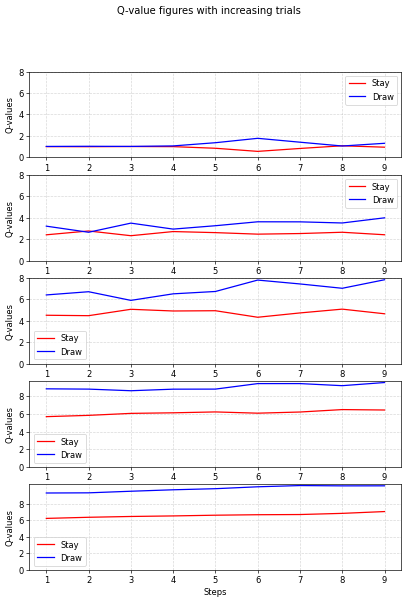

In [2]:
import matplotlib.pyplot as plt

allocation = DiscreteAssetAllocation()
play_rounds = [10, 20, 50, 100, 500]

steps = np.arange(1, 10)
fig=plt.figure(figsize=(8,11),dpi=60)
c=0
for i in range(len(play_rounds)):
    allocation.play(play_rounds[i])
    stays = []
    decreases = []
    for i in steps:
        stays.append(allocation.Q_values[i]['stay'])
        decreases.append(allocation.Q_values[i]['decrease'])
    c=c+1
    ax=fig.add_subplot(5,1,c)
    plt.plot(steps, stays, c = 'red', label = 'Stay')
    plt.plot(steps, decreases, c = 'blue', label = 'Draw')
    plt.xlabel('Steps')
    plt.ylabel('Q-values')
    plt.yticks(range(0, 10 , 2))
    plt.grid(True, linestyle = '--', alpha = 0.5)
    fig.suptitle("Q-value figures with increasing trials")
    plt.legend()
plt.show()


# Q Learning

$$
Q\left(s_{t}, a_{t}\right) \leftarrow Q\left(s_{t}, a_{t}\right)+\alpha\left[r_{t+1}+\gamma \max _{a} Q\left(s_{t+1}, a\right)-Q\left(s_{t}, a_{t}\right)\right]
$$

## Method description

We use time $t$ to represent the state.  Since we have $T=10$, hence we have 10 states. 

We suppose that the distribution of risky return $Y_t$ is that, 

$$
P(Y_t=a)=p,\quad P(Y_t=b)=1-p
$$

where $a=0.5$，$b=-0.3$，$p=0.6$. 

To simplify the prpblem, we first set that there are 2 choices for the action. One is in risky asset, another one is in riskfree. 

[[0.01771871 0.        ]
 [0.01303773 0.        ]
 [0.00945598 0.        ]
 [0.00678743 0.        ]
 [0.00988755 0.        ]
 [0.01420238 0.        ]
 [0.01033672 0.        ]
 [0.00743821 0.        ]
 [0.00530917 0.        ]
 [0.00376774 0.        ]]
[[0.04919718 0.        ]
 [0.02593964 0.        ]
 [0.01881155 0.        ]
 [0.02046028 0.        ]
 [0.01481044 0.        ]
 [0.02825779 0.        ]
 [0.02056417 0.        ]
 [0.02217516 0.        ]
 [0.01605565 0.        ]
 [0.01143961 0.        ]]
[[0.08007964 0.        ]
 [0.03870709 0.        ]
 [0.03725183 0.        ]
 [0.02703379 0.        ]
 [0.01996514 0.        ]
 [0.04216767 0.        ]
 [0.0308827  0.        ]
 [0.02938162 0.        ]
 [0.02119202 0.        ]
 [0.01486417 0.        ]]
[[0.09644106 0.        ]
 [0.06305835 0.        ]
 [0.05531639 0.        ]
 [0.03354927 0.        ]
 [0.02534077 0.        ]
 [0.05593885 0.        ]
 [0.04108624 0.        ]
 [0.0438891  0.        ]
 [0.03176162 0.        ]
 [0.01818599 0.       

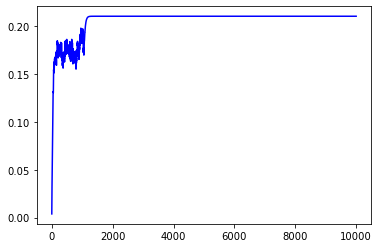

In [25]:
import numpy as np
import matplotlib.pyplot as plt

state_space_size = 10
action_space_size = 2

action_space = ['risky', 'riskless']
final_q_value = []

# Define the Q-table and the learning rate
Q = np.zeros((state_space_size, action_space_size))

alpha = 0.03

# define the parameters
p = 0.4
a = 0.5 
b = -0.3
r = 0.2
c = 0.5
W = [1]
T = 10

 
# Define the exploration rate and discount factor
epsilon = 0.1
gamma = 0.9

# define the number of episodes and initial state
num_episodes = 10000
initial_state = 0
initial_wealth = 100

def take_action(current_state_f, action):
    if action == 0:
        ran = np.random.binomial(1, p, 1)[0]
        if ran == 1:
            Y = a
        else:
            Y = b
        next_wealth = current_wealth * (1 + Y)
    else:
        next_wealth = current_wealth * (1 + r)
    reward_f = (1 - np.exp(- c * next_wealth)) / c
    W.append(next_wealth)
    return (current_state_f + 1), reward_f


for episode in range(num_episodes):
    current_state = initial_state
    for t in range(T):
        current_wealth = W[t]
        # Choose an action using an epsilon-greedy policy
        if np.random.uniform(0, 1) < epsilon:
            action = np.random.randint(0, action_space_size)
        else:
            action = np.argmax(Q[current_state])
 
        # Take the action and observe the next state and reward
        next_state, reward = take_action(current_state, action)
        if next_state == T:
            Q[current_state, action] = Q[current_state, action] + alpha * (reward - Q[current_state, action])
        else: 
        # Update the Q-table using the Bellman equation
            Q[current_state, action] = Q[current_state, action] + alpha * (reward + gamma * np.max(Q[next_state]) -Q[current_state, action])
        current_state = next_state
    print(Q)
    final_q_value.append(np.max(Q[state_space_size-1]))
    

plt.plot(range(num_episodes), final_q_value, c = 'blue')


# SARSA

$$
Q\left(s_{t}, a_{t}\right) \leftarrow Q\left(s_{t}, a_{t}\right)+\alpha\left[r_{t+1}+\gamma Q\left(s_{t+1}, a_{t+1}\right)-Q\left(s_{t}, a_{t}\right)\right]
$$

We use the same setting in Q Learning

[[0.03165801 0.        ]
 [0.         0.03560582]
 [0.02804449 0.        ]
 [0.02139644 0.        ]
 [0.0290354  0.        ]
 [0.02223833 0.        ]
 [0.01661084 0.        ]
 [0.01217971 0.        ]
 [0.00881132 0.        ]
 [0.00631325 0.        ]]
[[0.04938834 0.        ]
 [0.         0.07090067]
 [0.05582535 0.        ]
 [0.05821773 0.        ]
 [0.04470071 0.        ]
 [0.044258   0.        ]
 [0.04648417 0.        ]
 [0.02423193 0.        ]
 [0.01752876 0.        ]
 [0.0124371  0.        ]]
[[0.08147901 0.        ]
 [0.         0.10588675]
 [0.08376696 0.        ]
 [0.09435734 0.        ]
 [0.07359006 0.        ]
 [0.06642367 0.        ]
 [0.06235475 0.        ]
 [0.03615796 0.        ]
 [0.02615002 0.        ]
 [0.02478314 0.        ]]
[[0.0996123  0.        ]
 [0.         0.14057768]
 [0.11184609 0.        ]
 [0.11490999 0.        ]
 [0.08911173 0.        ]
 [0.10387004 0.        ]
 [0.09150318 0.        ]
 [0.05888183 0.        ]
 [0.03484598 0.        ]
 [0.03035289 0.       

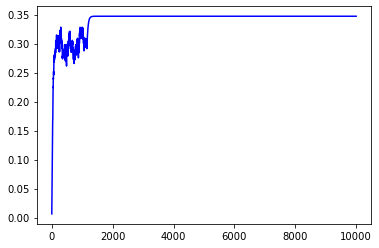

In [63]:
import numpy as np
import matplotlib.pyplot as plt

state_space_size = 10
action_space_size = 2

action_space = ['risky', 'riskless']
final_q_value = []

# Define the Q-table and the learning rate
Q = np.zeros((state_space_size, action_space_size))

alpha = 0.03

# define the parameters
p = 0.4
a = 0.5 
b = -0.3
r = 0.2
c = 0.5
W = [1]
T = 10

 
# Define the exploration rate and discount factor
epsilon = 0.1
gamma = 0.9

# define the number of episodes and initial state
num_episodes = 10000
initial_state = 0
initial_wealth = 100

def take_action(current_state_f, action):
    if action == 0:
        ran = np.random.binomial(1, p, 1)[0]
        if ran == 1:
            Y = a
        else:
            Y = b
        next_wealth = current_wealth * (1 + Y)
    else:
        next_wealth = current_wealth * (1 + r)
    reward_f = (1 - np.exp(- c * next_wealth)) / c
    W.append(next_wealth)
    return (current_state_f + 1), reward_f


for episode in range(num_episodes):
    current_state = initial_state
    # Choose an action using an epsilon-greedy policy
    if np.random.uniform(0, 1) < epsilon:
        action = np.random.randint(0, action_space_size)
    else:
        action = np.argmax(Q[current_state])
    for t in range(T):
        current_wealth = W[t]
    
        # Take the action and observe the next state and reward
        next_state, reward = take_action(current_state, action)

        if np.random.uniform(0, 1) < epsilon:
            next_action = np.random.randint(0, action_space_size)
        else:
            if next_state == T:
                next_action = np.argmax(Q[current_state])
            else:
                next_action = np.argmax(Q[next_state])

        if next_state == T:
            Q[current_state, action] = Q[current_state, action] + alpha * (reward - Q[current_state, action])
        else: 
        # Update the Q-table using the Bellman equation
            Q[current_state, action] = Q[current_state, action] + alpha * (reward + gamma * Q[next_state, next_action] - Q[current_state, action])
        current_state = next_state
        action = next_action
    print(Q)
    final_q_value.append(np.max(Q[state_space_size-1]))
    

plt.plot(range(num_episodes), final_q_value, c = 'blue')


# Q Learning for 3 actions

[[0.01771871 0.         0.        ]
 [0.02450668 0.         0.        ]
 [0.0184522  0.         0.        ]
 [0.01360951 0.         0.        ]
 [0.00988755 0.         0.        ]
 [0.00710589 0.         0.        ]
 [0.00506735 0.         0.        ]
 [0.         0.00602827 0.        ]
 [0.00881132 0.         0.        ]
 [0.01271915 0.         0.        ]]
[[0.03556755 0.         0.        ]
 [0.03730741 0.         0.        ]
 [0.05096724 0.         0.        ]
 [0.02707769 0.         0.        ]
 [0.01967032 0.         0.        ]
 [0.01413541 0.         0.        ]
 [0.01014545 0.         0.        ]
 [0.         0.01211359 0.        ]
 [0.01317672 0.         0.        ]
 [0.02505673 0.         0.        ]]
[[0.05322654 0.         0.        ]
 [0.06207099 0.         0.        ]
 [0.08287047 0.         0.        ]
 [0.05222271 0.         0.        ]
 [0.03867054 0.         0.        ]
 [0.02109117 0.         0.        ]
 [0.01014545 0.         0.00709853]
 [0.00779398 0.01211359 0.

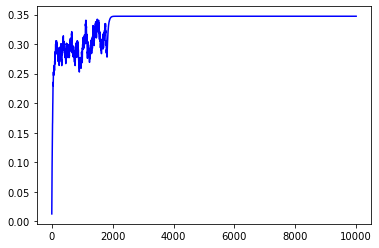

In [70]:
import numpy as np
import matplotlib.pyplot as plt

state_space_size = 10
action_space_size = 3

action_space = ['risky', 'riskless', 'half']
final_q_value = []

# Define the Q-table and the learning rate
Q = np.zeros((state_space_size, action_space_size))

alpha = 0.03

# define the parameters
p = 0.4
a = 0.5 
b = -0.3
r = 0.2
c = 0.5
W = [1]
T = 10

 
# Define the exploration rate and discount factor
epsilon = 0.1
gamma = 0.9

# define the number of episodes and initial state
num_episodes = 10000
initial_state = 0
initial_wealth = 100

def take_action(current_state_f, action):
    if action == 0:
        ran = np.random.binomial(1, p, 1)[0]
        if ran == 1:
            Y = a
        else:
            Y = b
        next_wealth = current_wealth * (1 + Y)
    elif action == 1:
        next_wealth = current_wealth * (1 + r)
    else: 
        ran = np.random.binomial(1, p, 1)[0]
        if ran == 1:
            Y = a
        else:
            Y = b
        next_wealth = 0.5 * current_wealth * (1 + r) + 0.5 * current_wealth * (1 + Y)
    reward_f = (1 - np.exp(- c * next_wealth)) / c
    W.append(next_wealth)
    return (current_state_f + 1), reward_f


for episode in range(num_episodes):
    current_state = initial_state
    for t in range(T):
        current_wealth = W[t]
        # Choose an action using an epsilon-greedy policy
        if np.random.uniform(0, 1) < epsilon:
            action = np.random.randint(0, action_space_size)
        else:
            action = np.argmax(Q[current_state])
 
        # Take the action and observe the next state and reward
        next_state, reward = take_action(current_state, action)
        if next_state == T:
            Q[current_state, action] = Q[current_state, action] + alpha * (reward - Q[current_state, action])
        else: 
        # Update the Q-table using the Bellman equation
            Q[current_state, action] = Q[current_state, action] + alpha * (reward + gamma * np.max(Q[next_state]) -Q[current_state, action])
        current_state = next_state
    print(Q)
    final_q_value.append(np.max(Q[state_space_size-1]))
    

plt.plot(range(num_episodes), final_q_value, c = 'blue')


# Q learning for 4 actions

[[0.01771871 0.         0.         0.        ]
 [0.01303773 0.         0.         0.        ]
 [0.0184522  0.         0.         0.        ]
 [0.01360951 0.         0.         0.        ]
 [0.01920867 0.         0.         0.        ]
 [0.01420238 0.         0.         0.        ]
 [0.01998814 0.         0.         0.        ]
 [0.01481675 0.         0.         0.        ]
 [0.01080402 0.         0.         0.        ]
 [0.01545297 0.         0.         0.        ]]
[[0.04919718 0.         0.         0.        ]
 [0.02618253 0.         0.         0.        ]
 [0.02772207 0.         0.         0.        ]
 [0.01360951 0.02191507 0.         0.        ]
 [0.03822454 0.         0.         0.        ]
 [0.04068217 0.         0.         0.        ]
 [0.0397767  0.         0.         0.        ]
 [0.02948071 0.         0.         0.        ]
 [0.0316877  0.         0.         0.        ]
 [0.03044235 0.         0.         0.        ]]
[[0.06614691 0.         0.         0.        ]
 [0.0391832

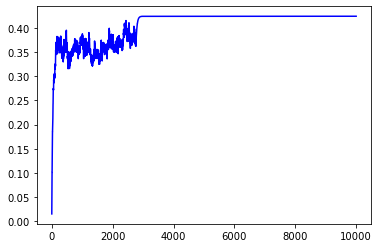

In [91]:
import numpy as np
import matplotlib.pyplot as plt

state_space_size = 10
action_space_size = 4

action_space = ['risky', 'riskless', 'half', '0.8risky']
final_q_value = []

# Define the Q-table and the learning rate
Q = np.zeros((state_space_size, action_space_size))

alpha = 0.03

# define the parameters
p = 0.4
a = 0.5 
b = -0.3
r = 0.2
c = 0.5
W = [1]
T = 10

 
# Define the exploration rate and discount factor
epsilon = 0.1
gamma = 0.9

# define the number of episodes and initial state
num_episodes = 10000
initial_state = 0
initial_wealth = 100

def take_action(current_state_f, action):
    if action == 0:
        ran = np.random.binomial(1, p, 1)[0]
        if ran == 1:
            Y = a
        else:
            Y = b
        next_wealth = current_wealth * (1 + Y)
    elif action == 1:
        next_wealth = current_wealth * (1 + r)
    elif action == 2: 
        ran = np.random.binomial(1, p, 1)[0]
        if ran == 1:
            Y = a
        else:
            Y = b
        next_wealth = 0.5 * current_wealth * (1 + r) + 0.5 * current_wealth * (1 + Y)
    else: 
        ran = np.random.binomial(1, p, 1)[0]
        if ran == 1:
            Y = a
        else:
            Y = b
        next_wealth = 0.2 * current_wealth * (1 + r) + 0.8 * current_wealth * (1 + Y)
    reward_f = (1 - np.exp(- c * next_wealth)) / c
    W.append(next_wealth)
    return (current_state_f + 1), reward_f


for episode in range(num_episodes):
    current_state = initial_state
    for t in range(T):
        current_wealth = W[t]
        # Choose an action using an epsilon-greedy policy
        if np.random.uniform(0, 1) < epsilon:
            action = np.random.randint(0, action_space_size)
        else:
            action = np.argmax(Q[current_state])
 
        # Take the action and observe the next state and reward
        next_state, reward = take_action(current_state, action)
        if next_state == T:
            Q[current_state, action] = Q[current_state, action] + alpha * (reward - Q[current_state, action])
        else: 
        # Update the Q-table using the Bellman equation
            Q[current_state, action] = Q[current_state, action] + alpha * (reward + gamma * np.max(Q[next_state]) -Q[current_state, action])
        current_state = next_state
    print(Q)
    final_q_value.append(np.max(Q[state_space_size-1]))
    

plt.plot(range(num_episodes), final_q_value, c = 'blue')
